In [4]:
import nibabel as nib
import numpy as np
import matplotlib.pylab as plt
import sys
import scipy.optimize as spopt
import scipy.fftpack as spfft
import scipy.ndimage as spimg
import plotly.express as px
import plotly.offline as py
import plotly.graph_objects as go
import plotly.io as pio
import seaborn as sns
import h5py
sys.path.append('../../../src/')

# custom scripts
import mri_cs
from visualization import plot_batch
from helpers import calculate_metrics, zero_fill
from spiraltrajectory import spiral_samples_trajectory, kspace_measurements_spiral, minimum_energy_reconstruction
# from mri_cs import lpminimization, hermitian

from tqdm import tqdm
from matplotlib.colors import LogNorm
from numpy.fft import fft2, fftshift
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

plt.rcParams['figure.figsize'] = (10.0, 8.0)
py.init_notebook_mode()
plt.style.use('dark_background')

In [13]:
DATA_PATH = '../../../data/FastMRIData/singlecoil_train/'
FILE_SAMPLE = DATA_PATH + 'file1001287.h5'

hf = h5py.File(FILE_SAMPLE, mode='r')
list(hf.keys())
dict(hf.attrs)

['ismrmrd_header', 'kspace', 'reconstruction_esc', 'reconstruction_rss']

{'acquisition': 'CORPD_FBK',
 'max': 0.0004624860345092124,
 'norm': 0.1396935333699368,
 'patient_id': '6999a1ffb63756b29125b8779ce2c956620ff82c62700fe687d4a0d823b066b8'}

# Images to be reconstructed

(640, 372)

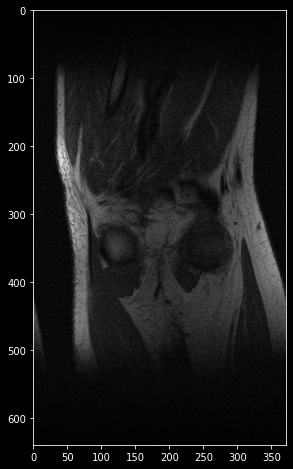

In [287]:
import fastmri
slice_kspace = hf["kspace"][()][-5]
rows, cols = slice_kspace.shape
rows, cols
slice_kspace = T.to_tensor(slice_kspace)

fully_sampled = fastmri.complex_abs(fastmri.ifft2c(slice_kspace))
plt.imshow(fully_sampled, cmap="gray")

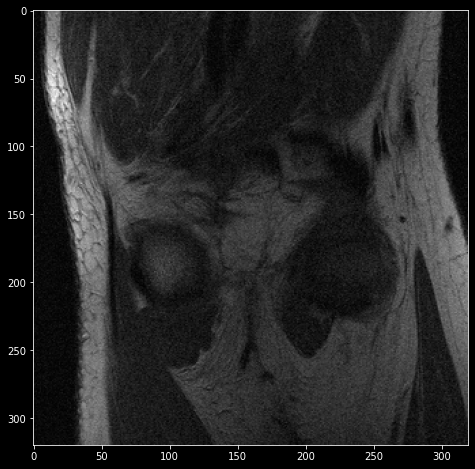

In [288]:
from fastmri.data import transforms as T

plt.imshow(T.center_crop(fully_sampled, (320, 320)), cmap="gray")

# K-space Trajectory

torch.Size([640, 372, 2])

<ipython-input-290-795679c38bdd>:5: RuntimeWarning:

divide by zero encountered in log



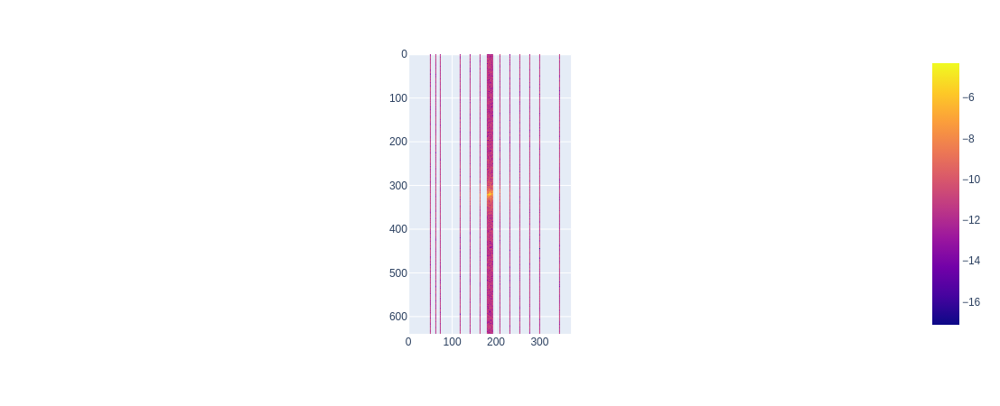

In [290]:
from fastmri.data.subsample import EquispacedMaskFunc
mask_func = EquispacedMaskFunc(center_fractions=[0.04], accelerations=[8])  # Create the mask function object
masked_kspace, mask = T.apply_mask(slice_kspace, mask_func)   # Apply the mask to k-space
masked_kspace.shape
px.imshow(np.log(fastmri.complex_abs(masked_kspace)))

# Zero filled

PSNR: 143.90210946598097
PSSIM: 0.9999999999738713
SNR: 10.213803052902222


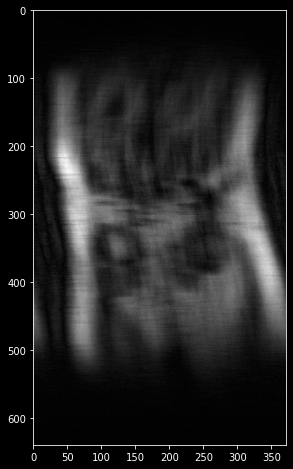

In [289]:
masked_img = fastmri.complex_abs(fastmri.ifft2c(masked_kspace))
plt.imshow(masked_img, cmap="gray")
calculate_metrics(fully_sampled.numpy(), masked_img.numpy())

In [241]:
masked_kspace.shape

torch.Size([640, 372, 2])

In [247]:
T.tensor_to_complex_np(masked_kspace)
samples_rows = np.where(T.tensor_to_complex_np(masked_kspace).flatten() != 0)[0]

samples_rows.size / T.tensor_to_complex_np(masked_kspace).size
samples_rows.shape
samples_rows

array([[0.+0.j, 0.+0.j, 0.+0.j, ..., 0.+0.j, 0.+0.j, 0.+0.j],
       [0.+0.j, 0.+0.j, 0.+0.j, ..., 0.+0.j, 0.+0.j, 0.+0.j],
       [0.+0.j, 0.+0.j, 0.+0.j, ..., 0.+0.j, 0.+0.j, 0.+0.j],
       ...,
       [0.+0.j, 0.+0.j, 0.+0.j, ..., 0.+0.j, 0.+0.j, 0.+0.j],
       [0.+0.j, 0.+0.j, 0.+0.j, ..., 0.+0.j, 0.+0.j, 0.+0.j],
       [0.+0.j, 0.+0.j, 0.+0.j, ..., 0.+0.j, 0.+0.j, 0.+0.j]],
      dtype=complex64)

0.11827956989247312

(28160,)

array([    19,     31,     42, ..., 238033, 238045, 238056])

# Measurements from the image to be reconstructed

In [248]:
stacked_kspace_hat = T.tensor_to_complex_np(slice_kspace).flatten()
stacked_kspace_hat.shape

# measurements to be used
b = stacked_kspace_hat[samples_rows]
b.size
b

b.size / stacked_kspace_hat.size

(238080,)

28160

array([ 7.1865989e-06-8.9623891e-06j, -6.2340605e-06-9.1436978e-06j,
        1.2085812e-05-3.5199832e-06j, ...,  7.8570474e-06-4.2560687e-06j,
        6.4484334e-07-6.6747771e-06j,  8.8483894e-06-1.7290558e-06j],
      dtype=complex64)

0.11827956989247312

# Image reconstruction

In [263]:
# reconstrucao do sinal a partir das medidas
A_ = lambda x: np.fft.fft2(np.reshape(x, (rows, cols))).flatten()[samples_rows]
img_size = rows * cols

# transposta conjugada
def a(x):
    a = np.reshape(x, (rows, cols))
    a = np.fft.fft2(a)
    a = a.flatten()[samples_rows]
    return a

def ah(x):
    x = fill_with_zeros(x, samples_rows, rows, cols)
    x = np.fft.ifft2(x)
    x = x * (rows * cols)
    x = x.flatten()
    return x

def fill_with_zeros(x, samples_rows, rows, cols):
    y = np.zeros((rows * cols)) * 1j

    y[samples_rows] = x
    y = np.reshape(y, (rows, cols))
    return y

In [264]:
b.size
samples_rows.shape
rows * cols
img_size * img_size

28160

(28160,)

238080

56682086400

In [265]:
import importlib
importlib.reload(mri_cs)

img_hat_r = mri_cs.lpminimization(A_, Ah=ah, b=b, p=1, N=(rows * cols), verbose=True)

<module 'mri_cs' from '../../../src/mri_cs.py'>

Starting stage 1
    Iteration 1
Starting stage 2
    Iteration 1
Starting stage 3
    Iteration 1
Starting stage 4
    Iteration 1
Starting stage 5
    Iteration 1
Starting stage 6
    Iteration 1
Starting stage 7
    Iteration 1
Starting stage 8
    Iteration 1
Starting stage 9
    Iteration 1
    Iteration 2
Starting stage 10
    Iteration 1
    Iteration 2
    Iteration 3
    Iteration 4


PSNR: 133.70466209758308
PSSIM: 0.9999999995788452
SNR: 0.016355672300172493


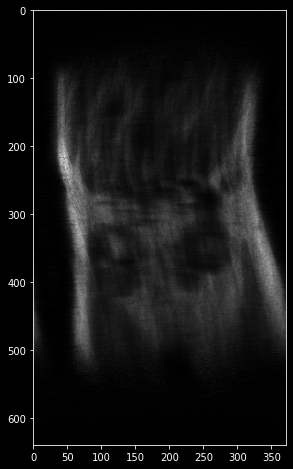

In [286]:
img_r = np.abs(np.fft.ifftshift(np.reshape(img_hat_r, (rows, cols))))
_ = plt.imshow(img_r, cmap='gray')
calculate_metrics(fully_sampled.numpy(), img_r)

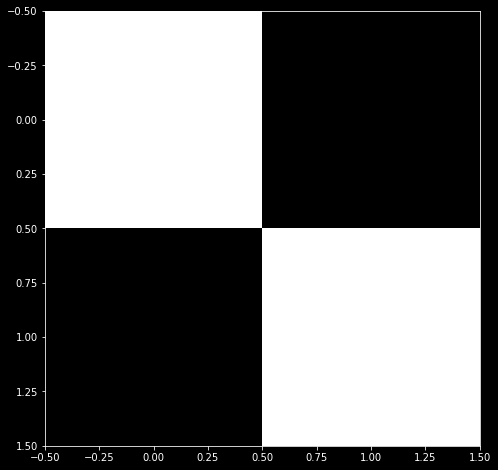

In [275]:
filter1 = np.array([[1, 1], [-1, -1]])
filter2 = filter1.copy().T
filter3 = np.array([[1, -1], [-1, 1]])

initial_filters = [filter1, filter2, filter3]
plt.imshow(filter3, cmap="gray");

In [276]:
prefilter_recon = mri_cs.prefiltering(samples_rows, b, rows, cols, h=initial_filters)

####### Reconstructing filtered image 1 of 3 #######
Starting stage 1 (image 1 of 3)
    Iteration 1 (image 1 of 3)
Starting stage 2 (image 1 of 3)
    Iteration 1 (image 1 of 3)
Starting stage 3 (image 1 of 3)
    Iteration 1 (image 1 of 3)
Starting stage 4 (image 1 of 3)
    Iteration 1 (image 1 of 3)
Starting stage 5 (image 1 of 3)
    Iteration 1 (image 1 of 3)
Starting stage 6 (image 1 of 3)
    Iteration 1 (image 1 of 3)
Starting stage 7 (image 1 of 3)
    Iteration 1 (image 1 of 3)
Starting stage 8 (image 1 of 3)
    Iteration 1 (image 1 of 3)
Starting stage 9 (image 1 of 3)
    Iteration 1 (image 1 of 3)
Starting stage 10 (image 1 of 3)
    Iteration 1 (image 1 of 3)
    Iteration 2 (image 1 of 3)
    Iteration 3 (image 1 of 3)
Finished reconstructing filtered image 1 of 3
####### Reconstructing filtered image 2 of 3 #######
Starting stage 1 (image 2 of 3)
    Iteration 1 (image 2 of 3)
Starting stage 2 (image 2 of 3)
    Iteration 1 (image 2 of 3)
Starting stage 3 (image 2 of 

# Compressed Sensing with Pre-filtering

PSNR: 133.70486962196333
PSSIM: 0.9999999995788672
SNR: 0.016563196680424903


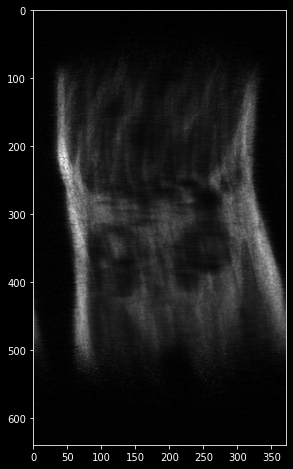

In [285]:
prefilter_recon_img = np.abs(np.fft.ifftshift(np.reshape(prefilter_recon, (rows, cols))))
_ = plt.imshow(prefilter_recon_img, cmap="gray")
calculate_metrics(fully_sampled.numpy(), prefilter_recon_img)